# 8b. MEZXRF SDD epithelial cell pellets by IMC analysis
## 1. Summary
This notebook quantifies channel features and generates the figures associated with the IMC breast cancer microarray scans comprising Supplementary Figure 1 in the MEZ-XRF paper.

In [1]:
import sys
sys.path.insert(0, '..\\code\\')

import pathlib
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt

import hph_adata_analysis as hph_adata
import scanpy as sc
import anndata as ad

import seaborn as sns

from shutil import copyfile
from imctools.io.mcd.mcdparser import McdParser
from imctools.io.txt.txtparser import TxtParser

from matplotlib_scalebar.scalebar import ScaleBar


from mpl_toolkits.axes_grid1 import ImageGrid
from matplotlib.pyplot import rc_context

from pymca_repack import unpack_pymca_h5, XrfImageMaskHDF

from skimage import filters
from skimage.transform import rescale, resize, downscale_local_mean

import high_plex_hdf as hph
import utilities

In [2]:
# Set data directory to work from 
base_dir = "C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF"
base_dir = pathlib.Path(base_dir)

# Specify the input directory where hdf files to process are located
input_dir = base_dir / 'data' / 'raw' / 'imc' / '20210721_MS_cell_pellets_MEZXRF_paper_imc'

# Gather mcd ROIs for repackaging
imc_filepaths = list(input_dir.glob('*.txt'))
imc_filepaths = [imc_filepath for imc_filepath in imc_filepaths if 'rnd' not in imc_filepath.stem]
imc_filepaths = [imc_filepath for imc_filepath in imc_filepaths if '1um' not in imc_filepath.stem]

# Make output directory for unpacked IMC files
out_dir = base_dir / 'data' / 'analysis' / 'imc' / '8b_imc_cell_pellet'
out_dir.mkdir(parents=True, exist_ok=True)
print('IMC epithelial cell pellet analysis will be output to: \n\t', out_dir) 

# Import csv of manually determined overlap coordinates between XRF and IMC
df_xrf_imc_overlap = pd.read_csv(base_dir / 'data' / 'raw' / 'imc_xrf_overlap_coords.csv')

# Import periodic table csv
df_periodic_table = pd.read_csv(base_dir / 'data' / 'raw' / 'xrf' / 'Periodic Table of Elements.csv')


IMC epithelial cell pellet analysis will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet


In [3]:
 # Collect experiment antibody panel for additional channel information
panel_path = base_dir / 'data' / 'raw' / 'antibody_panels' / 'epithelial_cell_pellet_panel.csv'
df_panel = pd.read_csv(panel_path)
df_panel

,ab_tag,tag_isotope,xrf_emission,target,shortname,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment
0,Y89,89,Y_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
1,Ag107,107,Ag_Ka,Tissue,Tissue,Ag,NaN,NaN,NaN,1.0
2,In113,113,In_Ka,Histone H3,HH3,D1H2,500.0,1.250,1.0,NaN
3,La139,139,La_Ka,Cytokeratin 8/18,CK 8/18,C51,500.0,2.500,NaN,1.0
4,Ce140,140,Ce_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
5,Pr141,141,Pr_Ka,Cytokeratin 5,CK5,EP1601Y,500.0,5.000,NaN,NaN
6,Nd150,150,Nd_Ka,CD44,CD44,polyclonal_CD44,500.0,1.250,NaN,1.0
7,Sm147,147,Sm_Ka,Keratin 14 (KRT14),CK 14,LL002,500.0,0.625,NaN,NaN
8,Eu153,153,Eu_Ka,Histone H3,HH3,D1H2,500.0,0.150,NaN,NaN
9,Gd158,158,Gd_Ka,Vimentin,Vim,EPR3776,440.0,0.400,NaN,NaN


In [4]:
def imc_txt_to_hph(imc_filepath, sample_name_ref, out_dir=None):
    acquisition_info = [
        'mcd_filepath',   
        'mcd_filename',   
        'acq_id',
        'acq_id_description',
        'step_um',
        'x_dim', 
        'y_dim',
    ]

    df_standard_measurements = pd.DataFrame(columns=acquisition_info)
    roi_dict = dict.fromkeys(acquisition_info)

    with TxtParser(imc_filepath) as parser:
        # Get acquisition
        acq_data = parser.get_acquisition_data()

        ## Collect key metadata for hdf packing
        roi_dict['mcd_filepath'] = str(imc_filepath)
        roi_dict['mcd_filename'] = str(imc_filepath.name)

        roi_dict['acq_id'] = acq_data.acquisition.id 
        roi_dict['acq_id_description'] = acq_data.acquisition.description

    #     assert(acq_data.acquisition.ablation_distance_between_shots_x == acq_data.acquisition.ablation_distance_between_shots_y)
        roi_dict['step_um'] = 0.5 # this may be accessible in mcd route, but not txt route, so defaults to 0.5
        roi_dict['x_dim'] = acq_data.acquisition.max_x
        roi_dict['y_dim'] = acq_data.acquisition.max_y

        ## Collect key channel information
        df_channels = pd.DataFrame(
            {
                'channel_labels':acq_data.channel_labels,
                'channel_masses':acq_data.channel_masses,
                'channel_names':acq_data.channel_names,
            }
        )

        ## Add panel information to channel information
        # Convert for panel merge
        df_channels['channel_masses'] = (pd.to_numeric(df_channels['channel_masses']))  

        # Panel merge
        df_channel_metadata = pd.merge(
            df_channels, 
            df_panel, 
            left_on='channel_masses', 
            right_on='tag_isotope', 
            how='left'
        ) 

        # Log channels loaded with a marker
        df_channel_metadata['loaded_channel'] = df_channel_metadata['channel_masses'].isin(df_panel['tag_isotope'])

        # Make longname for IMC samples
        df_channel_metadata['shortname'] = df_channel_metadata['shortname'].astype(str)
        df_channel_metadata['longname_imc'] = (
            df_channel_metadata[['channel_names', 'shortname']].agg(' | '.join, axis=1)
            )  
        
        # Add plot channel name
        df_channel_metadata['plot_channel'] = df_channel_metadata['longname_imc']

        ## Get image stack    
        img_stack = np.moveaxis(
            acq_data.image_data, 
            source=[0, 1, 2], 
            destination=[2, 1, 0],
        )
        img_stack = np.flip(img_stack, axis=1)

        # Package to hph object
        roi_hph = hph.HighPlexHdf(
            images = {'raw':img_stack},
            channel_metadata = df_channel_metadata,
            masks = {},
            sample_metadata=roi_dict
        )
        
        roi_hph.sample_metadata['sample_name_ref'] = sample_name_ref
        roi_hph.sample_metadata['AB_panel'] = panel_path.stem

        
        if isinstance(out_dir, pathlib.Path):
            if out_dir.is_dir():
                output_fpath = out_dir / f"{sample_name_ref}.h5"            
                roi_hph.export_hdf(
                    output_fpath = output_fpath
                )
  
    return roi_hph

for imc_filepath in imc_filepaths[:]:
    sample_name = imc_filepath.stem.split('_')[-3]
    roi_hph = imc_txt_to_hph(imc_filepath, sample_name_ref=sample_name, out_dir=out_dir)

## Segment IMC data

In [5]:
# Make output directory segmented images
out_sub_dir = out_dir / 'segmented'
out_sub_dir.mkdir(parents=True, exist_ok=True)
print('\n Segmented hdf files will be output to: \n\t',out_sub_dir) 

hdfs_to_segment = list(out_dir.glob('*.h5'))
hdfs_to_segment = [hdf_to_segment for hdf_to_segment in hdfs_to_segment if 'MCF7' not in hdf_to_segment.stem]


 Segmented hdf files will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\segmented


pixel size:  0.5


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


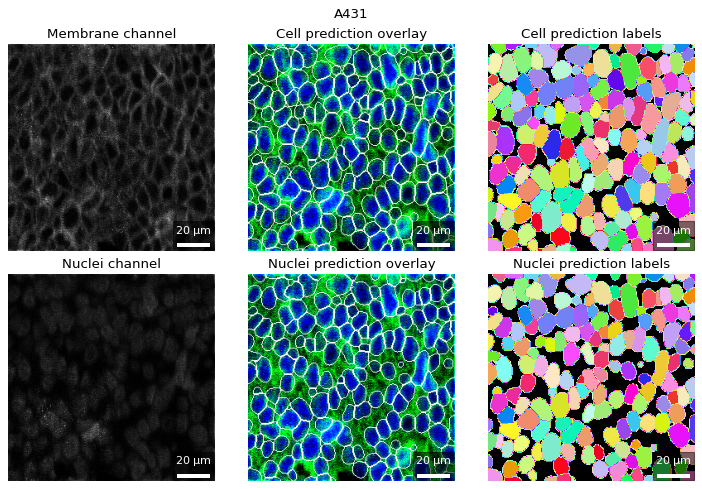

matched_cell_mask 160
matched_nuclei_mask 160
matched_non_nuclei_mask 160


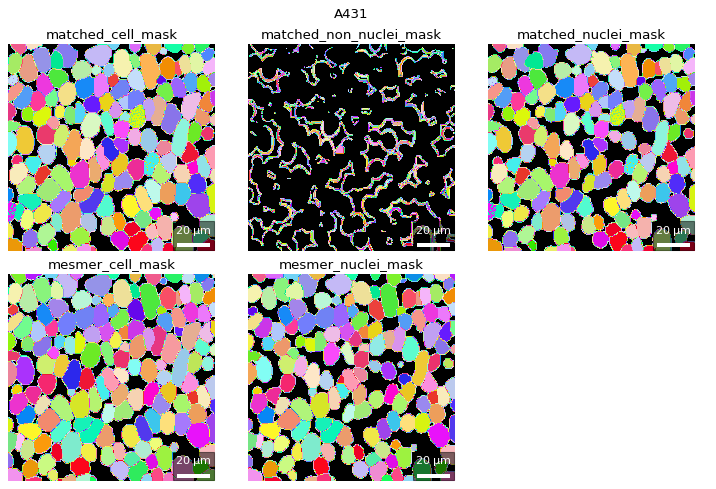

pixel size:  0.5


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


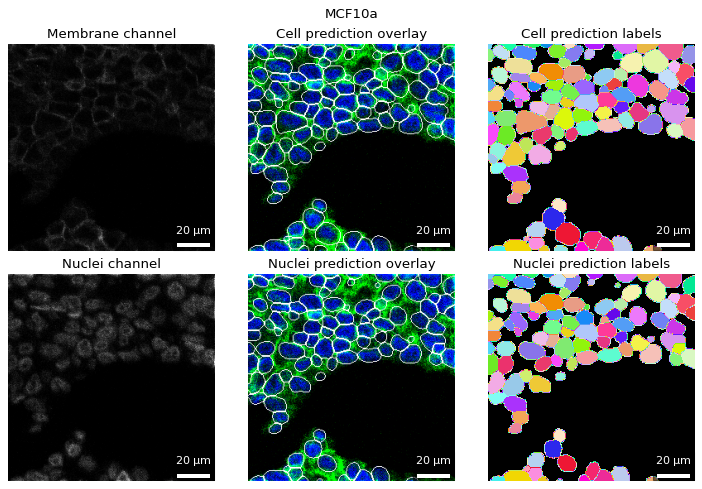

matched_cell_mask 95
matched_nuclei_mask 95
matched_non_nuclei_mask 95


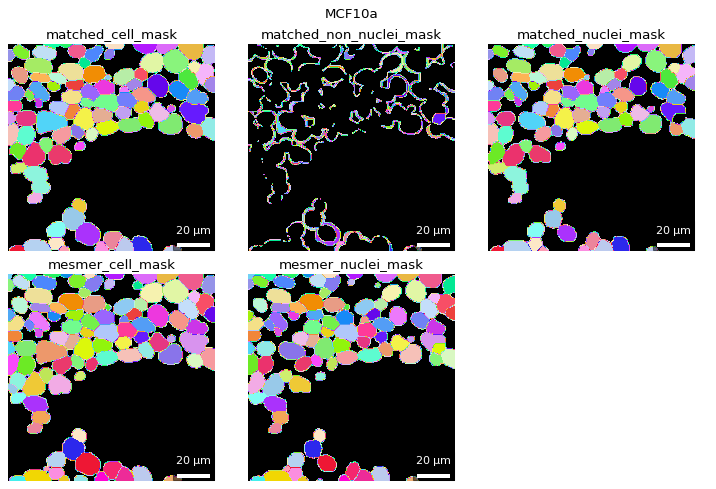

pixel size:  0.5


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


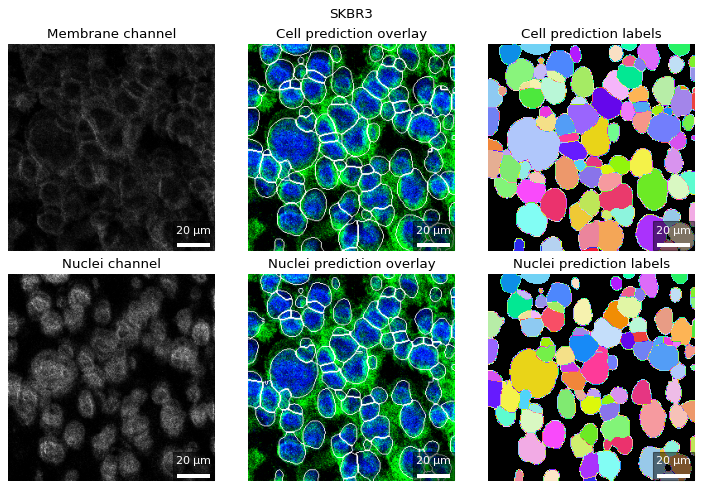

matched_cell_mask 85
matched_nuclei_mask 85
matched_non_nuclei_mask 85


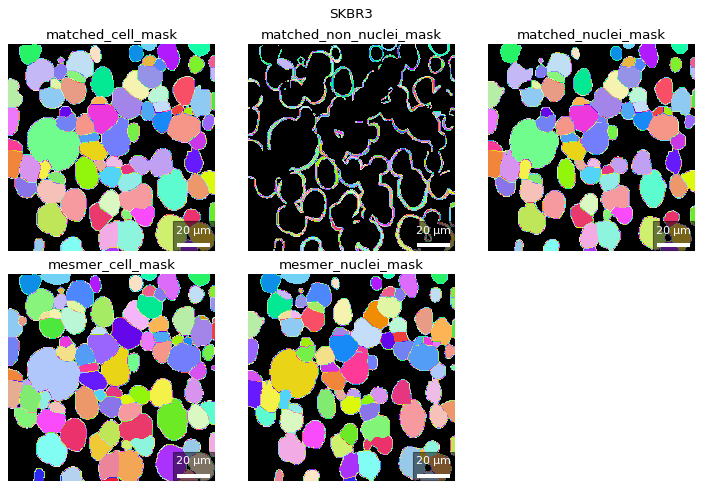

pixel size:  0.5


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


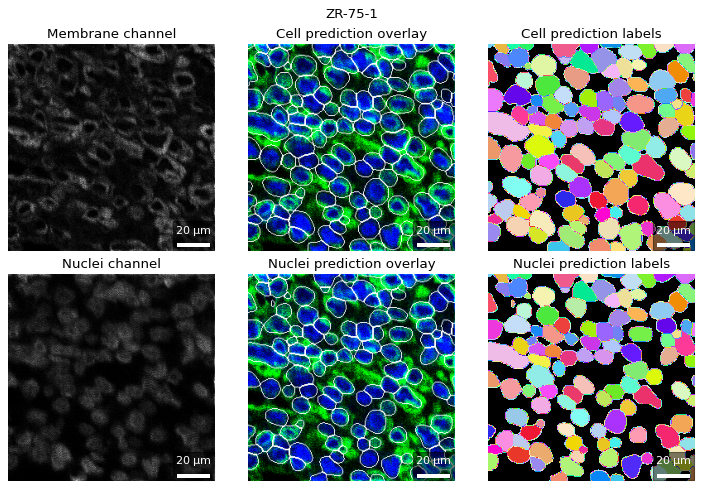

matched_cell_mask 118
matched_nuclei_mask 118
matched_non_nuclei_mask 118


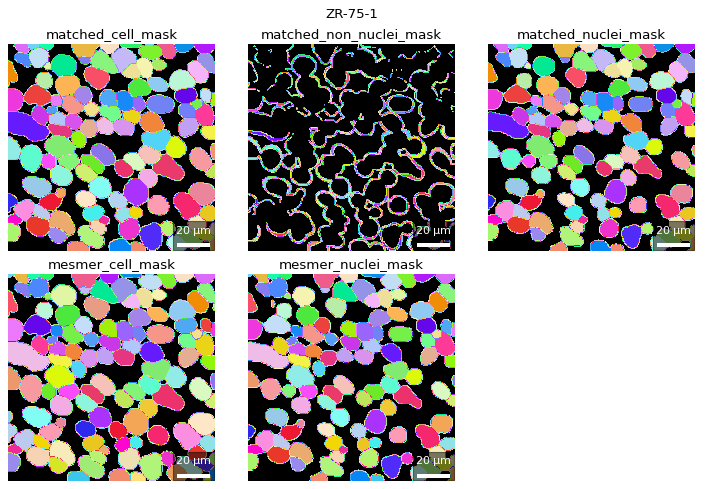

In [6]:
for hdf_fpath in hdfs_to_segment[:]:    
    hdf_segment = hph.hdf_to_HighPlex_Hdf(hdf_fpath=hdf_fpath)
    
    # Run segmentation
    # Parameters explained here https://github.com/vanvalenlab/deepcell-tf/blob/master/notebooks/applications/Mesmer-Application.ipynb
    hdf_segment.mesmer_segment()
    hdf_segment.mesmer_output_plot(out_dir = out_sub_dir)
    hdf_segment.cell_nuclei_match()
    hdf_segment.segmented_masks_plot(out_dir = out_sub_dir)
    hdf_segment.export_masks_to_source_hdf()
    
for source_fpath in hdfs_to_segment:
    output_fpath = out_sub_dir / f'{source_fpath.stem}_segmented.h5'
    source = copyfile(source_fpath, output_fpath)         

# hdf_segment.images['raw'].shape
# hdf_segment.channel_metadata

## Single cell analysis measurements of IMC data
Measure intensities for all cell masks

In [7]:
hdf_analysis_filepaths = [hdf_analysis_path for hdf_analysis_path in hdfs_to_segment if 'MCF7' not in hdf_analysis_path.stem]
# The order determines how loaded into hdf, and order of later output images
hdf_analysis_filepaths = [
    pathlib.Path(r'C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/analysis/imc/8b_imc_cell_pellet/MCF10a.h5'),
    pathlib.Path(r'C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/analysis/imc/8b_imc_cell_pellet/A431.h5'),
    pathlib.Path(r'C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/analysis/imc/8b_imc_cell_pellet/ZR-75-1.h5'),
    pathlib.Path(r'C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/analysis/imc/8b_imc_cell_pellet/SKBR3.h5'),]




In [8]:
hdf_analysis_filepaths = [hdf_analysis_path for hdf_analysis_path in hdfs_to_segment if 'MCF7' not in hdf_analysis_path.stem]

# All cell mask
image_n = 'raw'
mask_n = 'mesmer_cell_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_analysis_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
# Correct variable names
isotopes = [i[0] for i in adata.var.index.str.split(' ', expand=True)]
adata.var['ab_tag'] = isotopes
adata.var['ab_tag'] = adata.var['ab_tag'].astype(str)
adata.var['longname'] = adata.var.index
adata.var = adata.var.merge(df_panel, on='ab_tag', how='left')
adata.write(out_dir.joinpath(f'IMCofSDD_cell_pellets_adata_{mask_n}.h5ad'))
# Matched cell mask
image_n = 'raw'
mask_n = 'matched_cell_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_analysis_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
# Correct variable names
isotopes = [i[0] for i in adata.var.index.str.split(' ', expand=True)]
adata.var['ab_tag'] = isotopes
adata.var['ab_tag'] = adata.var['ab_tag'].astype(str)
adata.var['longname'] = adata.var.index
adata.var = adata.var.merge(df_panel, on='ab_tag', how='left')
adata.write(out_dir.joinpath(f'IMCofSDD_cell_pellets_adata_{mask_n}.h5ad'))


# Matched nuclear mask
mask_n = 'matched_nuclei_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_analysis_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.write(out_dir.joinpath('cell_pellets_adata_matched_nuclei.h5ad'))
# Correct variable names
isotopes = [i[0] for i in adata.var.index.str.split(' ', expand=True)]
adata.var['ab_tag'] = isotopes
adata.var['ab_tag'] = adata.var['ab_tag'].astype(str)
adata.var['longname'] = adata.var.index
adata.var = adata.var.merge(df_panel, on='ab_tag', how='left')
adata.write(out_dir.joinpath(f'IMCofSDD_cell_pellets_adata_{mask_n}.h5ad'))


# Non-nuclear mask
mask_n = 'matched_non_nuclei_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_analysis_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
# Correct variable names
isotopes = [i[0] for i in adata.var.index.str.split(' ', expand=True)]
adata.var['ab_tag'] = isotopes
adata.var['ab_tag'] = adata.var['ab_tag'].astype(str)
adata.var['longname'] = adata.var.index
adata.var = adata.var.merge(df_panel, on='ab_tag', how='left')
adata.write(out_dir.joinpath(f'IMCofSDD_cell_pellets_adata_{mask_n}.h5ad'))


AnnData expects .var.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname_x' as categorical
... storing 'xrf_emission' as categorical
... storing 'target' as categorical
... storing 'shortname_y' as categorical
... storing 'ab_clone' as categorical
AnnData expects .var.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname_x' as categorical
... storing 'xrf_emission' as categorical
... storing

## Single cell analysis

In [9]:
adata = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_matched_cell_mask.h5ad'))
adata.var.index = adata.var['xrf_emission']
adata.var

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


,shortname_x,longname,ab_tag,tag_isotope,xrf_emission,target,shortname_y,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment
xrf_emission,,,,,,,,,,,,
Y_Ka,pHH3,Y89 | pHH3,Y89,89,Y_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
Ag_Ka,Tissue,Ag107 | Tissue,Ag107,107,Ag_Ka,Tissue,Tissue,Ag,NaN,NaN,NaN,1.0
In_Ka,HH3,In113 | HH3,In113,113,In_Ka,Histone H3,HH3,D1H2,500.0,1.250,1.0,NaN
I_Ka,IdU,I127 | IdU,I127,127,I_Ka,IdU,IdU,IdU,NaN,NaN,NaN,NaN
La_Ka,CK 8/18,La139 | CK 8/18,La139,139,La_Ka,Cytokeratin 8/18,CK 8/18,C51,500.0,2.500,NaN,1.0
Ce_Ka,pHH3,Ce140 | pHH3,Ce140,140,Ce_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
Pr_Ka,CK5,Pr141 | CK5,Pr141,141,Pr_Ka,Cytokeratin 5,CK5,EP1601Y,500.0,5.000,NaN,NaN
Sm_Ka,CK 14,Sm147 | CK 14,Sm147,147,Sm_Ka,Keratin 14 (KRT14),CK 14,LL002,500.0,0.625,NaN,NaN
Nd_Ka,CD44,Nd150 | CD44,Nd150,150,Nd_Ka,CD44,CD44,polyclonal_CD44,500.0,1.250,NaN,1.0


### Correlation

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'Ce_Ka': 'Ce140 | pHH3', 'Y_Ka': 'Y89 | pHH3', 'Ag_Ka': 'Ag107 | Tissue', 'In_Ka': 'In113 | HH3', 'Eu_Ka': 'Eu153 | HH3', 'Yb_L3': 'Yb173 | HH3', 'Ir_L3': 'Ir191 | DNA'}
C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\ExtFig4O_HeatMapCorrelation.svg


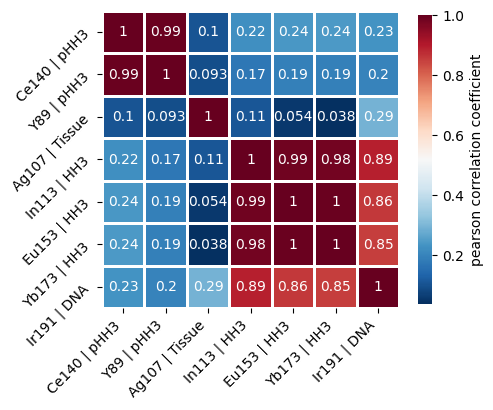

In [10]:
repeat_channels = [
    'Ce_Ka', 
    'Y_Ka', 
    'Ag_Ka',
    'In_Ka', 
    'Eu_Ka', 
    'Yb_L3', 
    'Ir_L3',
    ]

labels = {}
for label in repeat_channels:
    labels[label] = adata.var.loc[adata.var['xrf_emission'] == label, 'longname'].iloc[0]
print(labels)    

df_sc_mean = adata[:, repeat_channels].to_df()
df_sc_mean = df_sc_mean.iloc[:,:-1] # drop the last column (Ir repeat)
df_channel_correlation = df_sc_mean.corr()
df_channel_correlation

fig, ax = plt.subplots(figsize=(5,5), dpi=100)
sns.heatmap(df_channel_correlation,
            cmap='RdBu_r', 
            xticklabels = labels.values(),
            yticklabels = labels.values(),
            annot=True,
            square = True,
            ax=ax,
            linewidths=2,
            cbar_kws={
                'shrink': 0.7,
                'label': 'pearson correlation coefficient'
            },
            #vmin=-1,
            #vmax=1
            )


# ADDED: Remove labels.
ax.set_ylabel('')    
ax.set_xlabel('')
xlabels = ax.get_xticklabels() 
ax.set_xticklabels(xlabels, rotation=45, ha='right')
ax.set_yticklabels(xlabels, rotation=45, ha='right')

plt.tight_layout()
savename = out_dir / 'ExtFig4O_HeatMapCorrelation.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

## Subcellular localisation

In [11]:
adata_nuc = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_matched_nuclei_mask.h5ad'))
adata_non_nuc = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_matched_non_nuclei_mask.h5ad'))

assert adata_nuc.shape == adata_non_nuc.shape

region_measures = [
    'label_id',
    'sample',
    'channel',
    'longname',
    'nuclear_mean_counts',
    'non_nuclear_mean_counts'
]

# Build dataframe of matched nuclear and non-nuclear measurements
df_nuc_non_nuc = pd.DataFrame(columns=region_measures)
for event in adata_nuc.obs.index:
    region_measures=dict.fromkeys(region_measures)  
    region_measures['label_id'] = event
    
    event_nuc_measures = adata_nuc[adata_nuc.obs.index == event]
    event_non_nuc_measures = adata_non_nuc[adata_non_nuc.obs.index == event]
    region_measures['sample'] = adata_nuc.obs['sample_name_ref'][
        adata_nuc.obs.index == event
    ].iloc[0]
    
    for channel in adata_nuc.var.index:
        region_measures['channel'] = channel
        region_measures['longname'] = adata_nuc.var.longname[
            adata_nuc.var.index == channel
        ].iloc[0]
        
        region_measures['nuclear_mean_counts'] = event_nuc_measures[:, channel].X[0][0]
        region_measures['non_nuclear_mean_counts'] = event_non_nuc_measures[:, channel].X[0][0]
        
        df_nuc_non_nuc = df_nuc_non_nuc.append(region_measures, ignore_index=True)
        
# Add total counts
df_nuc_non_nuc['total_counts'] = df_nuc_non_nuc['nuclear_mean_counts'] + df_nuc_non_nuc['non_nuclear_mean_counts']        
        

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [12]:
# Drop zero counts
df_nuc_non_nuc = df_nuc_non_nuc[df_nuc_non_nuc['nuclear_mean_counts'] != 0]
df_nuc_non_nuc = df_nuc_non_nuc[df_nuc_non_nuc['non_nuclear_mean_counts'] != 0]


In [13]:
# Evaluate nuclear and non-nuclear ratios per marker
df_nuc_non_nuc['nuclear/non_nuclear'] = (
    df_nuc_non_nuc['nuclear_mean_counts'] / 
    df_nuc_non_nuc['non_nuclear_mean_counts']
)

df_nuc_non_nuc['log2(nuclear/non-nuclear)'] = (
    df_nuc_non_nuc['nuclear/non_nuclear'].apply(np.log2)    
)        


In [14]:
# Build dataframe of top percentage cells per cell type
percentage = 10

df_nuc_non_nuc_enriched = pd.DataFrame()
for sample in df_nuc_non_nuc['sample'].unique()[:]:
    df_nuc_non_nuc_sample = df_nuc_non_nuc[df_nuc_non_nuc['sample'] == sample]

    for longname in df_nuc_non_nuc['longname'].unique()[:]:
        df_nuc_non_nuc_sample_marker = df_nuc_non_nuc_sample[df_nuc_non_nuc_sample['longname'] == longname]

        cell_sample = int((len(df_nuc_non_nuc_sample_marker) / 100) * percentage)
        df_append = df_nuc_non_nuc_sample_marker.sort_values('total_counts').iloc[-cell_sample:,:]
        
        if df_nuc_non_nuc_enriched.empty:
            df_nuc_non_nuc_enriched = df_append
        else:
            df_nuc_non_nuc_enriched = pd.concat([df_nuc_non_nuc_enriched, df_append], ignore_index=True)
        
# Reindex markers according to average expression of the channel
rank_df_nuc_non_nuc_enriched = df_nuc_non_nuc_enriched.groupby(['longname']).mean()
rank_df_nuc_non_nuc_enriched = rank_df_nuc_non_nuc_enriched.sort_values('log2(nuclear/non-nuclear)').reset_index()

channel_list = rank_df_nuc_non_nuc_enriched['longname'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

rank_df_nuc_non_nuc_enriched['rank'] = rank_df_nuc_non_nuc_enriched['longname'].map(channel_order)
rank_df_nuc_non_nuc_enriched = rank_df_nuc_non_nuc_enriched.sort_values('rank').reindex()

channel_list = rank_df_nuc_non_nuc_enriched['longname'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

df_nuc_non_nuc_enriched['rank'] = df_nuc_non_nuc_enriched['longname'].map(channel_order)
df_nuc_non_nuc_enriched = df_nuc_non_nuc_enriched.sort_values('rank').reindex()

df_nuc_non_nuc_enriched

,label_id,sample,channel,longname,nuclear_mean_counts,non_nuclear_mean_counts,total_counts,nuclear/non_nuclear,log2(nuclear/non-nuclear),rank
614,2-78,SKBR3,12,Dy164 | CK 7,11.466391,6.407793,17.874184,1.789445,0.839512,0
821,3-19,ZR-75-1,12,Dy164 | CK 7,0.040816,0.186583,0.227400,0.218757,-2.192602,0
820,3-111,ZR-75-1,12,Dy164 | CK 7,0.069883,0.142857,0.212740,0.489181,-1.031559,0
281,0-94,A431,12,Dy164 | CK 7,0.612250,0.284036,0.896286,2.155539,1.108048,0
280,0-103,A431,12,Dy164 | CK 7,0.037612,0.608333,0.645945,0.061828,-4.015593,0
...,...,...,...,...,...,...,...,...,...,...
182,0-141,A431,13,Ho165 | Ki-67,12.284867,4.526780,16.811647,2.713820,1.440325,19
183,0-93,A431,13,Ho165 | Ki-67,14.631752,2.389469,17.021221,6.123431,2.614340,19
184,0-135,A431,13,Ho165 | Ki-67,11.947349,5.157475,17.104823,2.316511,1.211954,19
186,0-117,A431,13,Ho165 | Ki-67,15.549780,3.544893,19.094673,4.386530,2.133080,19


### Subcellular localisation of enriched positive cells

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\ExtFig4S_CellMarkerLocalisationViolinPlot.svg


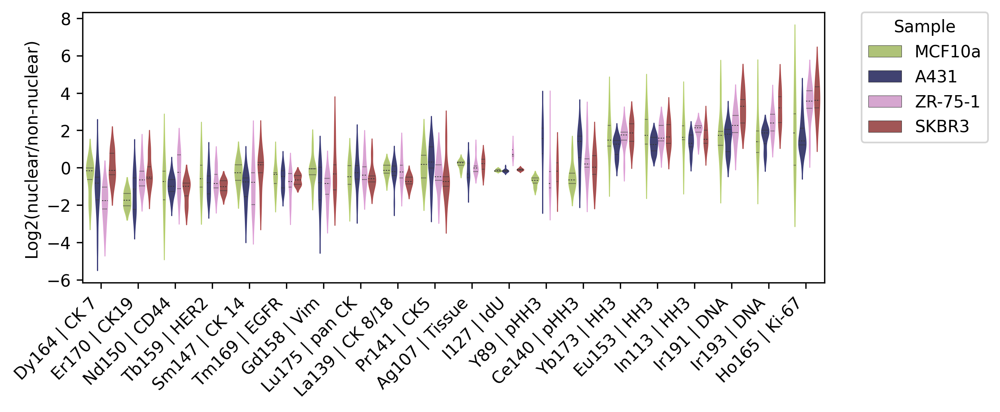

In [15]:
from matplotlib.collections import PolyCollection

palette=['#b5cf6b', '#393b79', '#de9ed6', '#ad494a']

fig, axs = plt.subplots(dpi=300, figsize=(8,3))

ax = sns.violinplot(
    data = df_nuc_non_nuc_enriched,
    x = 'longname',
    y = 'log2(nuclear/non-nuclear)',       
    hue = 'sample',
    hue_order = ['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
    palette=palette,
    ax=axs,    
    inner='quartiles',
#     medianprops=dict(color="red", alpha=0.7),
    linewidth=0.5
    )

xlabels = axs.get_xticklabels() 
axs.set(xlabel='', ylabel='Log2(nuclear/non-nuclear)')
plt.xticks(rotation=45, ha='right')

violins = [art for art in ax.get_children() if isinstance(art, PolyCollection)]
n=4
colors = sns.color_palette(palette, n_colors=n) * (len(violins)//n)
for i in range(len(violins)):
    violins[i].set_edgecolor(colors[i])


plt.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

savename = out_dir / 'ExtFig4S_CellMarkerLocalisationViolinPlot.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

In [16]:
# Reindex markers according to average expression of the channel
rank_df_nuc_non_nuc = df_nuc_non_nuc.groupby(['longname']).mean()
rank_df_nuc_non_nuc = rank_df_nuc_non_nuc.sort_values('log2(nuclear/non-nuclear)').reset_index()

channel_list = rank_df_nuc_non_nuc['longname'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

df_nuc_non_nuc['rank'] = df_nuc_non_nuc['longname'].map(channel_order)
df_nuc_non_nuc = df_nuc_non_nuc.sort_values('rank').reindex()


### Subcellular localisation of all cells

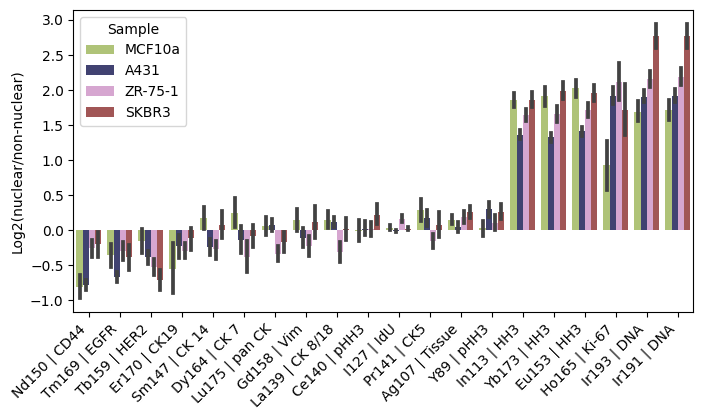

In [17]:
fig, axs = plt.subplots(dpi=100, figsize=(8,4))

sns.barplot(
    data = df_nuc_non_nuc,
    x = 'longname',
    y = 'log2(nuclear/non-nuclear)',       
    hue = 'sample',
    hue_order = ['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
    palette=['#b5cf6b', '#393b79', '#de9ed6', '#ad494a'],
    ax=axs,    
    )

xlabels = axs.get_xticklabels() 
axs.set(xlabel='', ylabel='Log2(nuclear/non-nuclear)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sample')

plt.show()

In [18]:
# adata.var.set_index('xrf_emission', inplace=True)
adata.var

,shortname_x,longname,ab_tag,tag_isotope,xrf_emission,target,shortname_y,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment
xrf_emission,,,,,,,,,,,,
Y_Ka,pHH3,Y89 | pHH3,Y89,89,Y_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
Ag_Ka,Tissue,Ag107 | Tissue,Ag107,107,Ag_Ka,Tissue,Tissue,Ag,NaN,NaN,NaN,1.0
In_Ka,HH3,In113 | HH3,In113,113,In_Ka,Histone H3,HH3,D1H2,500.0,1.250,1.0,NaN
I_Ka,IdU,I127 | IdU,I127,127,I_Ka,IdU,IdU,IdU,NaN,NaN,NaN,NaN
La_Ka,CK 8/18,La139 | CK 8/18,La139,139,La_Ka,Cytokeratin 8/18,CK 8/18,C51,500.0,2.500,NaN,1.0
Ce_Ka,pHH3,Ce140 | pHH3,Ce140,140,Ce_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN
Pr_Ka,CK5,Pr141 | CK5,Pr141,141,Pr_Ka,Cytokeratin 5,CK5,EP1601Y,500.0,5.000,NaN,NaN
Sm_Ka,CK 14,Sm147 | CK 14,Sm147,147,Sm_Ka,Keratin 14 (KRT14),CK 14,LL002,500.0,0.625,NaN,NaN
Nd_Ka,CD44,Nd150 | CD44,Nd150,150,Nd_Ka,CD44,CD44,polyclonal_CD44,500.0,1.250,NaN,1.0


### Cell type clustering

In [19]:
# adata = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_mesmer_cell_mask.h5ad'))
adata = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_matched_cell_mask.h5ad'))
adata.var.set_index('xrf_emission', inplace=True)

# adata.X = np.arcsinh(adata.X/5)
# adata.X = np.arcsinh(adata.X/1)

adata.X = np.log(adata.X)
adata.X[np.isinf(adata.X)] = 0

cluster_channels = [
    'Ce_Ka',
    'Gd_Ka',
    'I_Ka',
    'Tb_Ka',
    'Er_L3',
#     'La_Ka',
    'Tm_L3',
]

cluster_channel_var = []
for i in adata.var.index: 
    cluster_channel_var.append(i in cluster_channels)
adata.var['cluster_channels'] = cluster_channel_var
adata.var['cluster_channels'] = adata.var['cluster_channels'].astype('category')

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
<ipython-input-19-9cdc44c28745>:8: RuntimeWarning: divide by zero encountered in log
  adata.X = np.log(adata.X)


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


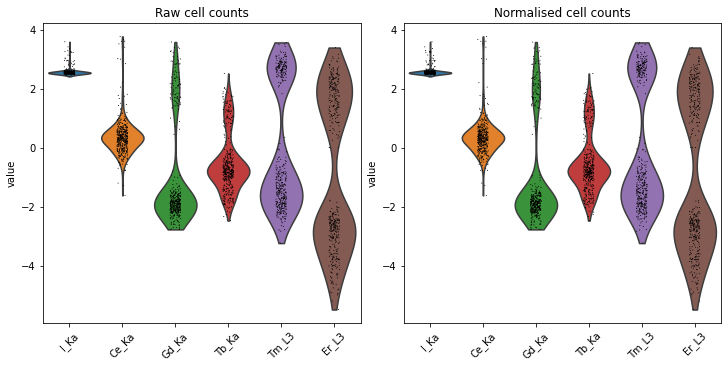

In [20]:
adata = adata[:, adata.var['cluster_channels']==True]
# adata.raw.var_names_make_unique()

# normalised_data = adata.X.copy()
# normalised_data = hph_adata.column_percentile_normalise_test(
#     normalised_data, 
#     2, 
#     98, 
#     crop=False
# )
# adata.X = normalised_data

fig, axs = plt.subplots(1, 2, figsize=(10,5), constrained_layout=True)
set_xticklabels = {'labels': list(adata.var_names), 'rotation':45}
g1 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[0], 
    show=False, 
#     use_raw=True,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)
g2 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[1], 
    show=False, 
#     use_raw=False,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)

axs[0].title.set_text('Raw cell counts')
axs[1].title.set_text('Normalised cell counts')                      

plt.show()

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


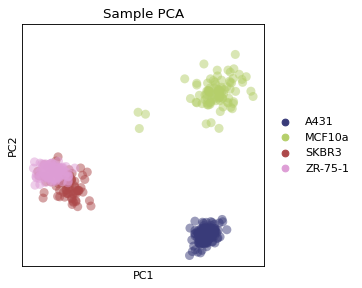

In [21]:
# Principal component analyses
sc.tl.pca(adata, svd_solver='arpack')

# Plot out principal components
fig, axs = plt.subplots(figsize=(4,4), dpi=80)
sc.pl.pca(
    adata, 
    color='sample_name_ref', 
    palette = 'tab20b',
    ax=axs, 
    title='Sample PCA', 
    show=False,
    **{'alpha':0.5}
)
plt.axis('square')
plt.show()

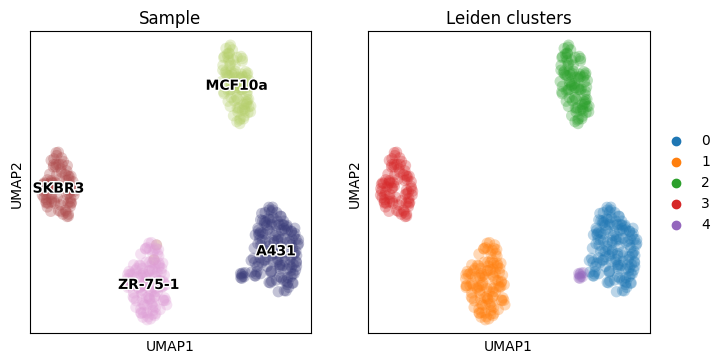

In [22]:
sc.pp.neighbors(adata, n_neighbors=17)
sc.tl.umap(adata, random_state=5)
sc.tl.leiden(adata, resolution=0.3)

fig, axs = plt.subplots(1, 2, figsize=(8,4), dpi=100)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_name_ref',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    title = 'Leiden clusters',
    **{'alpha':0.3}
    )
plt.show()




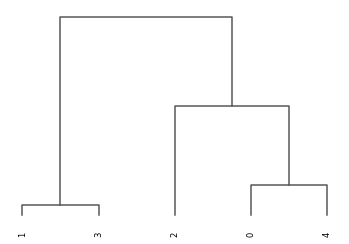

In [23]:
sc.tl.dendrogram(adata, groupby = "leiden", cor_method='spearman')
dendrogram = sc.pl.dendrogram(adata, groupby = "leiden")

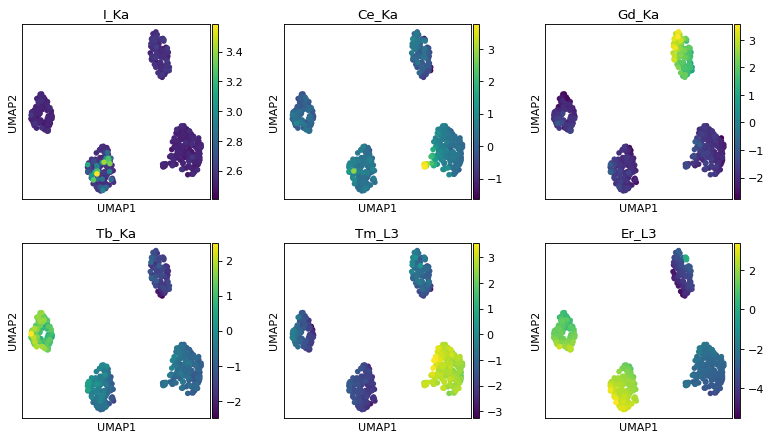

In [24]:
with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 80}):
    sc.pl.umap(
        adata, 
        color=adata.var_names, 
        ncols=3, 
        # frameon=False, 
        show=False, 
        use_raw=False, 
        size=100,
        # legend='off'
    )
plt.show()

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


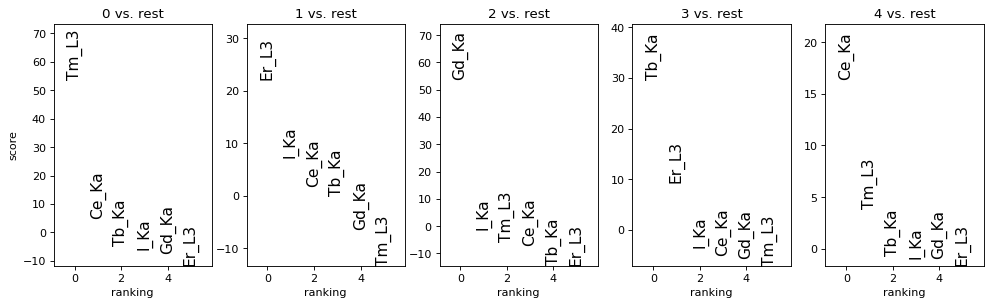

In [25]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden', 
                        use_raw=False, 
                        method='t-test_overestim_var', 
                        # method='t-test', 
                        n_genes=6
                        ) # compute differential expression
     
with rc_context({'figure.figsize': (3, 4), 'figure.dpi': 80}):
    sc.pl.rank_genes_groups(
        adata, 
        groupby='leiden', 
        n_genes=6, 
        ncols=6, 
        sharey=False, 
        fontsize=14
    )
    
# Manually curate cluster names based on marker differences
cluster2annotation = {
     '0': 'A431',
     '1': 'ZR-75-1',
     '2': 'MFC10a',
     '3': 'SKBR3',
#      '4': 'I-dU ZR-75-1',
     '4': 'mitotic A431',
}

# Annotate adata with leiden cell type cluster names
adata.obs['leiden_cluster_names'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\ExtFig4P_LeidenClusters.svg


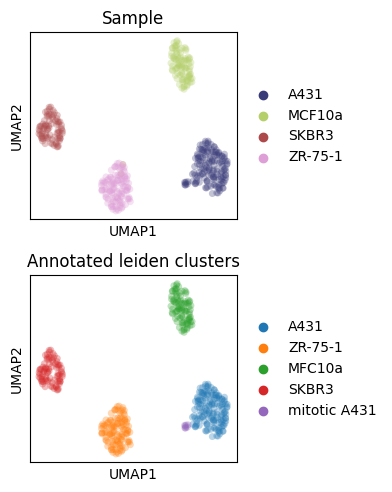

In [26]:
fig, axs = plt.subplots(2, 1, figsize=(4,5), dpi=100)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_name_ref',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    size=100,
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden_cluster_names', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    #legend_loc='best',
    legend_fontoutline=2,
    title = 'Annotated leiden clusters',
    size=100,
    **{'alpha':0.3}
    )

fig.tight_layout(pad=1)

savename = out_dir / 'ExtFig4P_LeidenClusters.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\segmented\IMCofSDD_cluster_coloured_mask.png


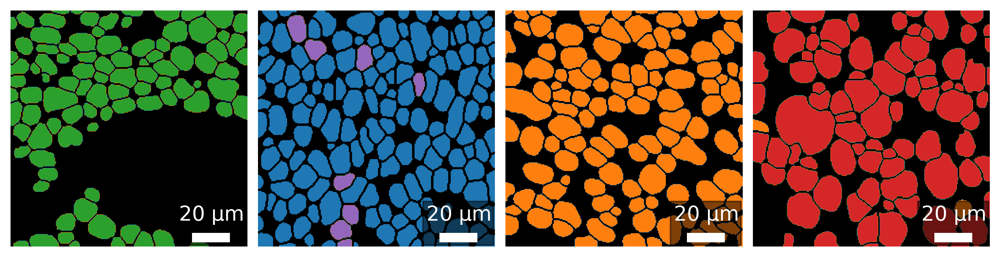

In [27]:
from importlib import reload  # Python 3.4+
reload(hph_adata)

save_name = out_sub_dir / "IMCofSDD_cluster_coloured_mask.png"
print(save_name)

hph_adata.adata_hph_mask_cluster_plot(
    adata=adata,
    hdf_ids=['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
    cluster_name='leiden',
    plot_names=['', '', '', ''],
    save_name = str(save_name)
    )


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
<ipython-input-28-49de0065daf9>:8: RuntimeWarning: divide by zero encountered in log
  adata2.X = np.log(adata2.X)


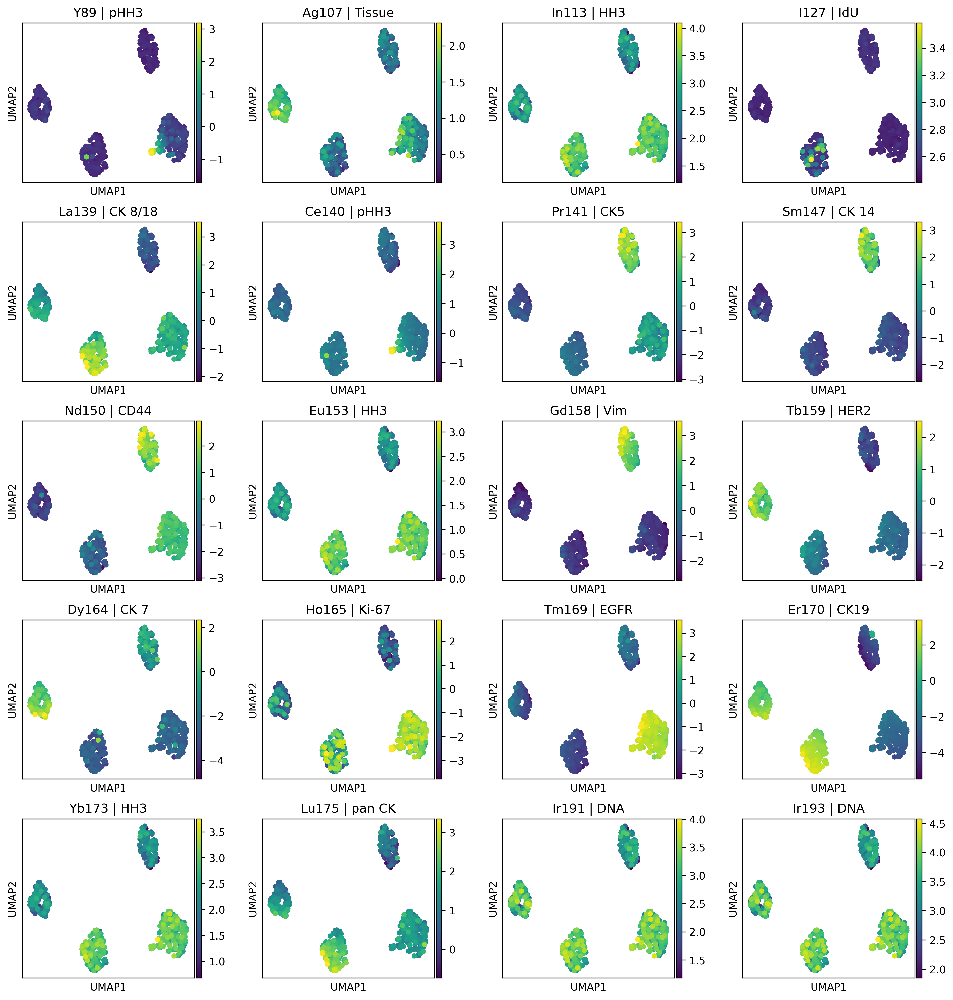

In [28]:
adata2 = ad.read_h5ad(out_dir.joinpath('IMCofSDD_cell_pellets_adata_matched_cell_mask.h5ad'))

adata2.obs = adata.obs
adata2.obsm = adata.obsm
adata2.var.set_index('longname', inplace=True)


adata2.X = np.log(adata2.X)
adata2.X[np.isinf(adata2.X)] = 0

# # Resetting the normalised data
# normalised_data = adata.X.copy()
# normalised_data = hph_adata.column_percentile_normalise_test(normalised_data, 2, 98, crop=False)
# adata.X = normalised_data

with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 300}):
    sc.pl.umap(
        adata2, 
        color=adata2.var_names, 
        ncols=4, 
        show=False, 
        use_raw=False, 
        size=100,
    )
plt.show()

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\ExtFig4R_CellMarkerHeatMap.svg


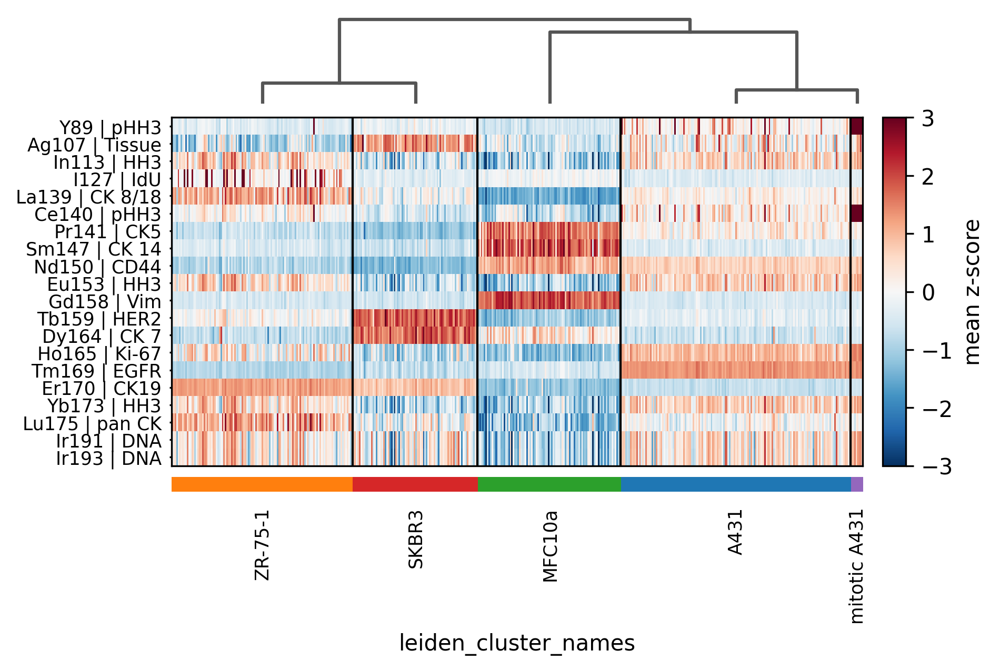

In [29]:
sc.tl.dendrogram(adata, groupby = "leiden_cluster_names", cor_method='spearman')
adata2.layers['scaled'] = sc.pp.scale(adata2, copy=True).X
# adata2.var['xrf_edge'] = adata2.var_names
# adata2.var_names = adata2.var['longname']

# Heatmap for all markers
with rc_context({'figure.dpi': 300}):
    axes = sc.pl.heatmap(
        adata2, 
        var_names = adata2.var_names,
        groupby='leiden_cluster_names', 
        layer='scaled', 
        vmin=-3, 
        vmax=3, 
        cmap='RdBu_r', 
        dendrogram=True, 
        swap_axes=True, 
        # use_raw=False,
        figsize=(6,4),
        var_group_rotation=90,
        show=False
        )
    axes['heatmap_ax'].figure.axes[-1].set_ylabel('mean z-score', size=10)
    
    savename = out_dir / 'ExtFig4R_CellMarkerHeatMap.svg'
    print(savename)
    plt.savefig(savename, bbox_inches='tight')
    
    plt.show()
    


In [30]:
def multi_hph_plot(hph_fpath_dict, hph_list, img_lib, channels, pxl, scale, color_bar_label):
    """
    Function to plot multiple hph_paths
    
    :param hph_fpath_dict: dicitonary of hph filenames and filepaths
    :param hph_list: ordered list of hph files to plot from hph dict
    :param img_lib: image node from hph['images'] of hph files to plot
    :param channels: ordered list of channels to plot
    """
    
    fig = plt.figure(
        figsize=(3*len(hph_list), 3*len(channels)), 
        dpi=300
    )

    grid = ImageGrid(
        fig, 111,          # as in plt.subplot(111)
        nrows_ncols=(len(channels), len(hph_list)),
        axes_pad=0.1,
        share_all=True,
        cbar_mode="edge",
        cbar_location="right",
        cbar_size="5%",
        cbar_pad=0.1,
    )

    grid_counter = 0
    for row, channel in enumerate(channels):

        img_max = dict.fromkeys(hph_list)
        img_min = dict.fromkeys(hph_list)

        # Get min max values for row
        for hph_roi in hph_list:
            hph_hdf = hph.hdf_to_HighPlex_Hdf(hph_fpath_dict[hph_roi])

            plot_channels = hph_hdf.channel_metadata[
                (hph_hdf.channel_metadata['shortname'] != 'nan') &
                (hph_hdf.channel_metadata['xrf_emission'].isin(channels))    
            ]

            idx = plot_channels[plot_channels['xrf_emission'] == channel].index
            img = hph_hdf.images[img_lib][:,:,idx]

            low_p, high_p = np.percentile(img, [0.5,99.5])
            img_min[hph_roi] = low_p
            img_max[hph_roi] = high_p

        vmin=min(img_min.values())
        vmax=max(img_max.values())

        # Set colorbar for row
        cax = grid.cbar_axes[row]        
        cbar = plt.colorbar(
            plt.cm.ScalarMappable(
                norm=plt.Normalize(
                    vmin=vmin, 
                    vmax=vmax,
                ), 
                cmap='gray'
            ), 
            cax=cax,
        )
        
        # Pad tick labels for consistent width
        tick_labels = [tick for tick in cbar.ax.get_yticks()]
        if np.max(tick_labels) < 10:
            tick_labels_padded = ['{0: <4}'.format(round(lbl,1)) for lbl in tick_labels]
        else:
            tick_labels_padded = ['{0: <4d}'.format(int(lbl)) for lbl in tick_labels]
        cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar
        
        cbar.set_label(color_bar_label, rotation=270, labelpad=15, fontsize = 14)

        # Plot channel per sample
        for hph_roi in hph_list:
            hph_hdf = hph.hdf_to_HighPlex_Hdf(hph_fpath_dict[hph_roi])
            img = hph_hdf.images[img_lib][:,:,idx]
            
            # If element represented in multiple channels, take the first
            if img.shape[-1] == 2:
                img = img[:,:,0]

            img = filters.gaussian(img, sigma=0.8)

            grid[grid_counter].imshow(
                img,
                vmin=vmin,
                vmax=vmax,
                cmap = 'gray'
            )

            grid[grid_counter].axis('off')

            grid[grid_counter].text(
                0.03, 0.97, 
                s = plot_channels['longname_imc'][
                    plot_channels['xrf_emission'] == channel
                ].iloc[0],
                horizontalalignment='left', 
                verticalalignment='top', 
                transform=grid[grid_counter].transAxes,
                fontsize=18,
                color='white',
                bbox=dict(facecolor='black', alpha=0.5)
            )

            scalebar = ScaleBar(
                        pxl,
                        "um", 
                        fixed_value=scale,
                        location='lower right',
                        width_fraction=0.04,
                        color='white',
                        scale_loc='top',
                        box_alpha=0.5,
                        box_color='black',
                        font_properties={'size':14},
                    )
            grid[grid_counter].add_artist(scalebar)

            grid_counter =  grid_counter+1


<ipython-input-30-e250ff46a4a3>:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


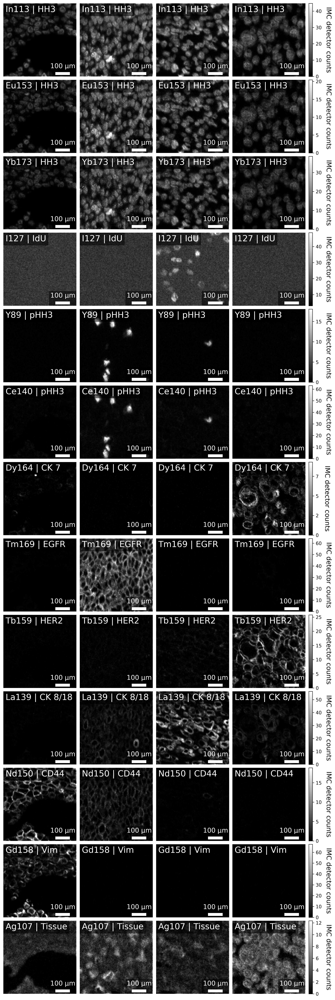

In [31]:
hph_list = ['MCF10a', 'A431', 'ZR-75-1', 'SKBR3']

fig_channels_1= [
    'In_Ka',
    'Eu_Ka',
    'Yb_L3',
    'I_Ka',
    'Y_Ka',
    'Ce_Ka',
    'Dy_Ka',
    'Tm_L3', 
    'Tb_Ka',   
    'La_Ka',
#     'Pr_Ka',
    'Nd_Ka',
    'Gd_Ka',
    'Ag_Ka',
#     'Er_L3'
]

hdf_dict = {i.stem:i for i in hdf_analysis_filepaths}

multi_hph_plot(
    hph_fpath_dict = hdf_dict, 
    hph_list = hph_list, 
    img_lib = 'raw', 
    channels = fig_channels_1,
    pxl=2,
    scale=100,
    color_bar_label = 'IMC detector counts'
)


## Signal to noise comparison

In [32]:
adata2.obs['Hz'] = 200
adata2.X = np.exp(adata2.X) # we are going to compare raw signal between instruments

df_to_map = adata2.var
df_to_map['longname'] = df_to_map.index
df_to_map['Symbol'] = df_to_map['xrf_emission'].str.split('_', expand=True).iloc[:,0]
df_to_map = pd.merge(df_to_map, df_periodic_table[['AtomicNumber', 'Element', 'Symbol']], on='Symbol')
df_to_map

,shortname_x,ab_tag,tag_isotope,xrf_emission,target,shortname_y,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment,longname,Symbol,AtomicNumber,Element
0,pHH3,Y89,89,Y_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN,Y89 | pHH3,Y,39,Yttrium
1,Tissue,Ag107,107,Ag_Ka,Tissue,Tissue,Ag,NaN,NaN,NaN,1.0,Ag107 | Tissue,Ag,47,Silver
2,HH3,In113,113,In_Ka,Histone H3,HH3,D1H2,500.0,1.250,1.0,NaN,In113 | HH3,In,49,Indium
3,IdU,I127,127,I_Ka,IdU,IdU,IdU,NaN,NaN,NaN,NaN,I127 | IdU,I,53,Iodine
4,CK 8/18,La139,139,La_Ka,Cytokeratin 8/18,CK 8/18,C51,500.0,2.500,NaN,1.0,La139 | CK 8/18,La,57,Lanthanum
5,pHH3,Ce140,140,Ce_Ka,Histone H3,pHH3,HTA28,500.0,1.250,NaN,NaN,Ce140 | pHH3,Ce,58,Cerium
6,CK5,Pr141,141,Pr_Ka,Cytokeratin 5,CK5,EP1601Y,500.0,5.000,NaN,NaN,Pr141 | CK5,Pr,59,Praseodymium
7,CK 14,Sm147,147,Sm_Ka,Keratin 14 (KRT14),CK 14,LL002,500.0,0.625,NaN,NaN,Sm147 | CK 14,Sm,62,Samarium
8,CD44,Nd150,150,Nd_Ka,CD44,CD44,polyclonal_CD44,500.0,1.250,NaN,1.0,Nd150 | CD44,Nd,60,Neodymium
9,HH3,Eu153,153,Eu_Ka,Histone H3,HH3,D1H2,500.0,0.150,NaN,NaN,Eu153 | HH3,Eu,63,Europium


In [33]:
df_signal_to_noise = pd.DataFrame()
for hz in adata2.obs['Hz'].unique():
    row = {}
    row['Hz'] = hz
    adata_Hz = adata2[adata2.obs['Hz'] == hz]
    for var_name in adata_Hz.var_names:
        row['var_name'] = var_name

        var_values = adata_Hz[:,var_name].X

        # Sample the max and mean signal in top and bottom (specified) % of cells
        non_zero_values = sorted(var_values[np.nonzero(var_values)])
        percentage = 1
        cell_sample = int(len(non_zero_values) / 100) * percentage
        row['minval'] = np.mean(non_zero_values[:cell_sample])
        row['maxval'] = np.max(non_zero_values[-cell_sample:])

        # Add rows to dataframe
        if df_signal_to_noise.empty:
            df_signal_to_noise = pd.DataFrame(columns=row.keys())            
        df_signal_to_noise = df_signal_to_noise.append(row, ignore_index=True)
            
# # Sort data types
df_signal_to_noise['var_name'] = df_signal_to_noise['var_name'].astype('category')
df_signal_to_noise['Hz'] = df_signal_to_noise['Hz'].astype('category')
df_signal_to_noise['minval'] = df_signal_to_noise['minval'].astype('float')
df_signal_to_noise['maxval'] = df_signal_to_noise['maxval'].astype('float')
df_signal_to_noise['signal-to-noise'] = (df_signal_to_noise['maxval'] - (df_signal_to_noise['minval']))
 
df_signal_to_noise[['ab_tag', 'shortname']] = df_signal_to_noise['var_name'].str.split(' ', expand=True).iloc[:,[0,2]].rename(columns={0:'ab_tag', 1:'shortname'})
df_signal_to_noise = pd.merge(df_signal_to_noise, df_to_map, left_on='ab_tag', right_on='ab_tag', suffixes=('', '_y'))
df_signal_to_noise.drop(df_signal_to_noise.filter(regex='_y$').columns, axis=1, inplace=True)
df_signal_to_noise['Method'] = 'IMC'
df_signal_to_noise


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


,Hz,var_name,minval,maxval,signal-to-noise,ab_tag,shortname,shortname_x,tag_isotope,xrf_emission,...,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment,longname,Symbol,AtomicNumber,Element,Method
0,200,Y89 | pHH3,0.196761,24.122105,23.925343,Y89,pHH3,pHH3,89,Y_Ka,...,HTA28,500.0,1.250,NaN,NaN,Y89 | pHH3,Y,39,Yttrium,IMC
1,200,Ag107 | Tissue,1.173500,10.136012,8.962512,Ag107,Tissue,Tissue,107,Ag_Ka,...,Ag,NaN,NaN,NaN,1.0,Ag107 | Tissue,Ag,47,Silver,IMC
2,200,In113 | HH3,3.736708,59.952644,56.215936,In113,HH3,HH3,113,In_Ka,...,D1H2,500.0,1.250,1.0,NaN,In113 | HH3,In,49,Indium,IMC
3,200,I127 | IdU,11.509180,36.051105,24.541925,I127,IdU,IdU,127,I_Ka,...,IdU,NaN,NaN,NaN,NaN,I127 | IdU,I,53,Iodine,IMC
4,200,La139 | CK 8/18,0.209701,34.223312,34.013611,La139,CK,CK 8/18,139,La_Ka,...,C51,500.0,2.500,NaN,1.0,La139 | CK 8/18,La,57,Lanthanum,IMC
5,200,Ce140 | pHH3,0.309250,43.152359,42.843109,Ce140,pHH3,pHH3,140,Ce_Ka,...,HTA28,500.0,1.250,NaN,NaN,Ce140 | pHH3,Ce,58,Cerium,IMC
6,200,Pr141 | CK5,0.091404,30.749405,30.658001,Pr141,CK5,CK5,141,Pr_Ka,...,EP1601Y,500.0,5.000,NaN,NaN,Pr141 | CK5,Pr,59,Praseodymium,IMC
7,200,Sm147 | CK 14,0.087592,27.304861,27.217269,Sm147,CK,CK 14,147,Sm_Ka,...,LL002,500.0,0.625,NaN,NaN,Sm147 | CK 14,Sm,62,Samarium,IMC
8,200,Nd150 | CD44,0.054095,19.092522,19.038427,Nd150,CD44,CD44,150,Nd_Ka,...,polyclonal_CD44,500.0,1.250,NaN,1.0,Nd150 | CD44,Nd,60,Neodymium,IMC
9,200,Eu153 | HH3,1.239524,25.141581,23.902057,Eu153,HH3,HH3,153,Eu_Ka,...,D1H2,500.0,0.150,NaN,NaN,Eu153 | HH3,Eu,63,Europium,IMC


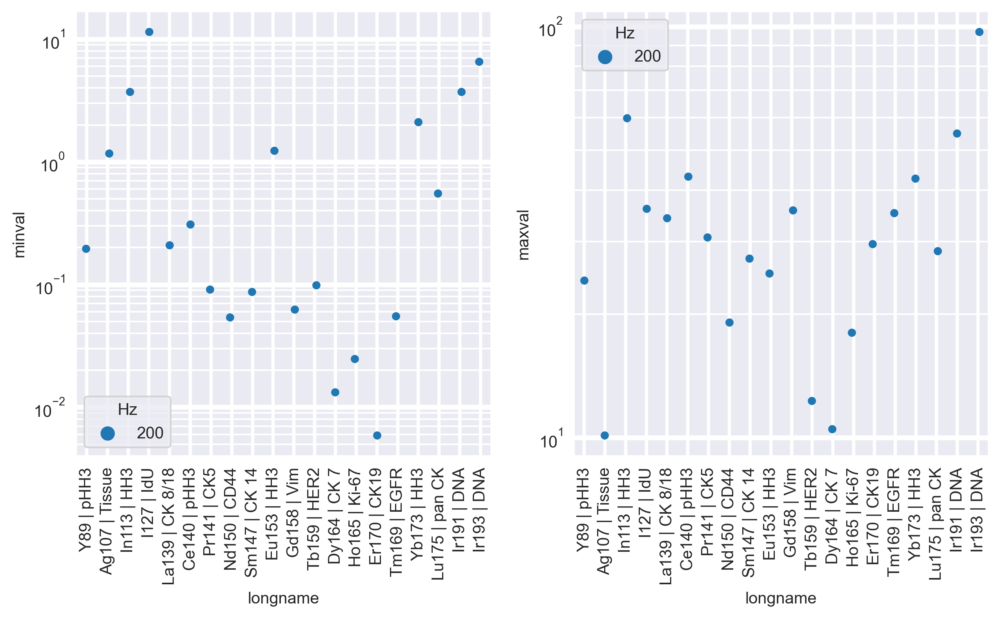

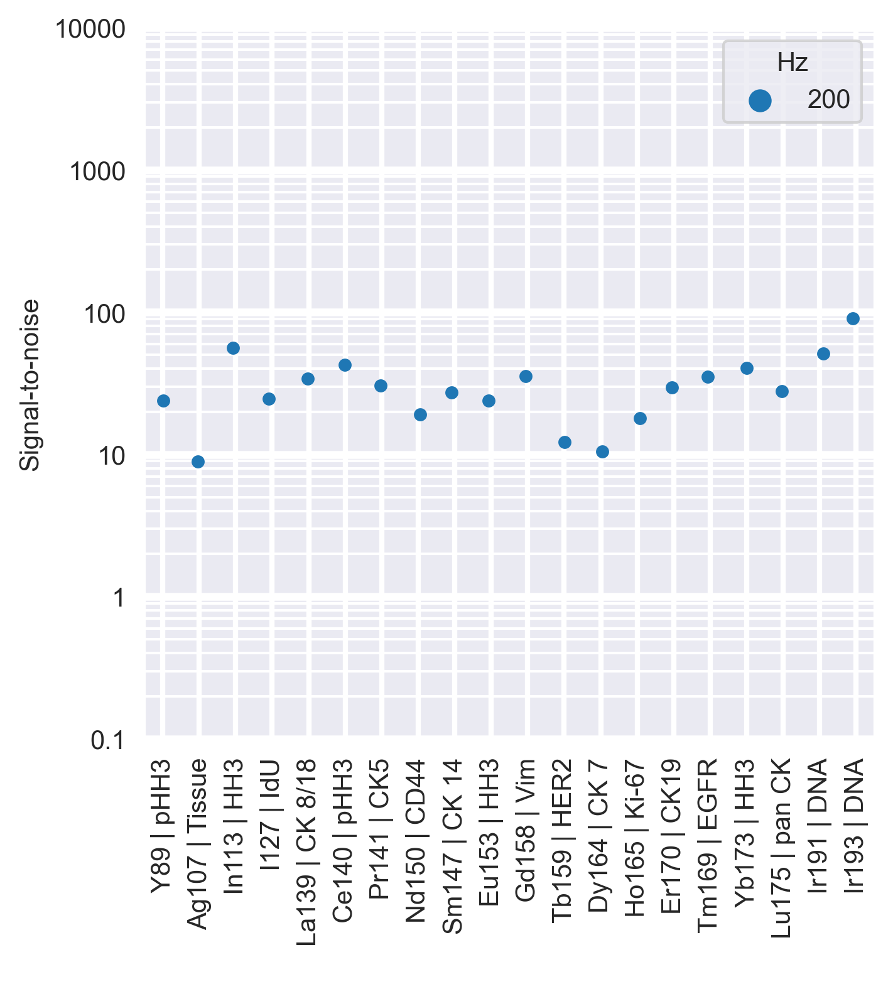

In [34]:
# Set seaborn
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

sns.set_style("dark")

### Check max and min values
fig, axs = plt.subplots(ncols = 2, figsize=(10,5), dpi=300)

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'minval',
    ax=axs[0],
    hue='Hz'
)
axs[0].tick_params(axis='x', rotation=90)

# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'maxval',
    ax=axs[1],
    hue='Hz',
)
axs[1].tick_params(axis='x', rotation=90)


# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

# Sort shared legend
# axs[0].get_legend().remove()
# axs[1].get_legend().remove()
# plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)#, ha='right')
plt.show()

### Plot signal to noise
fig, ax = plt.subplots(figsize=(5,5), dpi=300)
g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    ax=ax,
    hue='Hz'
)
ax.set(yscale="log")
ax.set_ylim([0.1, 10000])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')
plt.xticks(rotation=90)#, ha='right')
plt.ylabel('Signal-to-noise')
plt.xlabel(' ')
# plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.show()

## IMC and XRF signal to noise

In [35]:
adata_xrf_path = pathlib.Path(r'C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/processed/xrf/5b_cell_pellet_quantification/cell_pellets_adata_matched_cell_analysed_signal_to_noise.h5ad')
adata_xrf_path.exists()

adata_xrf = ad.read_h5ad(adata_xrf_path)
adata_xrf.obs['Hz'] = 1
adata_xrf.var


,shortname,longname
Ag_Ka,Tissue,Ag_Ka | Tissue
Ce_Ka,pHH3,Ce_Ka | pHH3
Dy_Ka,CK 7,Dy_Ka | CK 7
Er_L3,CK19,Er_L3 | CK19
Eu_Ka,HH3,Eu_Ka | HH3
Gd_Ka,Vim,Gd_Ka | Vim
Ho_Ka,Ki-67,Ho_Ka | Ki-67
I_Ka,IdU,I_Ka | IdU
In_Ka,HH3,In_Ka | HH3
Ir_L3,DNA,Ir_L3 | DNA


In [36]:
df_xrf_signal_to_noise = pd.DataFrame()
for hz in adata_xrf.obs['Hz'].unique():
    row = {}
    row['Hz'] = hz
    adata_Hz = adata_xrf[adata_xrf.obs['Hz'] == hz]
    for var_name in adata_Hz.var_names:
        row['var_name'] = var_name

        var_values = adata_Hz[:,var_name].X

        # Sample the max and mean signal in top and bottom (specified) % of cells
        non_zero_values = sorted(var_values[np.nonzero(var_values)])
        percentage = 1
        cell_sample = int(len(non_zero_values) / 100) * percentage
        row['minval'] = np.mean(non_zero_values[:cell_sample])
        row['maxval'] = np.max(non_zero_values[-cell_sample:])

        # Add rows to dataframe
        if df_xrf_signal_to_noise.empty:
            df_xrf_signal_to_noise = pd.DataFrame(columns=row.keys())            
        df_xrf_signal_to_noise = df_xrf_signal_to_noise.append(row, ignore_index=True)
            
# # Sort data types
df_xrf_signal_to_noise['var_name'] = df_xrf_signal_to_noise['var_name'].astype('category')
df_xrf_signal_to_noise['Hz'] = df_xrf_signal_to_noise['Hz'].astype('category')
df_xrf_signal_to_noise['minval'] = df_xrf_signal_to_noise['minval'].astype('float')
df_xrf_signal_to_noise['maxval'] = df_xrf_signal_to_noise['maxval'].astype('float')
df_xrf_signal_to_noise['signal-to-noise'] = (df_xrf_signal_to_noise['maxval'] - (df_xrf_signal_to_noise['minval']))
 
df_xrf_signal_to_noise['xrf_emission'] = df_xrf_signal_to_noise['var_name'].str.split(' ', expand=True).iloc[:,0]
# df_xrf_signal_to_noise[['ab_tag', 'shortname']] = df_xrf_signal_to_noise['var_name'].str.split(' ', expand=True).iloc[:,[0,2]].rename(columns={0:'ab_tag', 1:'shortname'})
df_xrf_signal_to_noise = pd.merge(df_xrf_signal_to_noise, df_to_map, left_on='xrf_emission', right_on='xrf_emission', suffixes=('', '_y'))
df_xrf_signal_to_noise.drop(df_xrf_signal_to_noise.filter(regex='_y$').columns, axis=1, inplace=True)
df_xrf_signal_to_noise['Method'] = 'XRF(SDD)'
df_xrf_signal_to_noise

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


,Hz,var_name,minval,maxval,signal-to-noise,xrf_emission,shortname_x,ab_tag,tag_isotope,target,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment,longname,Symbol,AtomicNumber,Element,Method
0,1,Ag_Ka,63.597668,303.333313,239.735645,Ag_Ka,Tissue,Ag107,107,Tissue,Ag,NaN,NaN,NaN,1.0,Ag107 | Tissue,Ag,47,Silver,XRF(SDD)
1,1,Ce_Ka,9.564506,118.671837,109.107331,Ce_Ka,pHH3,Ce140,140,Histone H3,HTA28,500.0,1.250,NaN,NaN,Ce140 | pHH3,Ce,58,Cerium,XRF(SDD)
2,1,Dy_Ka,29.017885,34.263447,5.245562,Dy_Ka,CK 7,Dy164,164,Cytokeratin 7,RCK105,500.0,5.000,NaN,NaN,Dy164 | CK 7,Dy,66,Dysprosium,XRF(SDD)
3,1,Er_L3,91.368568,138.804932,47.436363,Er_L3,CK19,Er170,170,Cytokeratin 19,A53-B/A2.26,500.0,0.320,NaN,NaN,Er170 | CK19,Er,68,Erbium,XRF(SDD)
4,1,Eu_Ka,12.676461,36.610775,23.934314,Eu_Ka,HH3,Eu153,153,Histone H3,D1H2,500.0,0.150,NaN,NaN,Eu153 | HH3,Eu,63,Europium,XRF(SDD)
5,1,Gd_Ka,12.682240,45.828728,33.146487,Gd_Ka,Vim,Gd158,158,Vimentin,EPR3776,440.0,0.400,NaN,NaN,Gd158 | Vim,Gd,64,Gadolinium,XRF(SDD)
6,1,Ho_Ka,50.285465,67.216721,16.931255,Ho_Ka,Ki-67,Ho165,165,Ki-67,B56,500.0,0.600,NaN,NaN,Ho165 | Ki-67,Ho,67,Holmium,XRF(SDD)
7,1,I_Ka,13.870594,184.275024,170.404430,I_Ka,IdU,I127,127,IdU,IdU,NaN,NaN,NaN,NaN,I127 | IdU,I,53,Iodine,XRF(SDD)
8,1,In_Ka,87.682564,646.709045,559.026482,In_Ka,HH3,In113,113,Histone H3,D1H2,500.0,1.250,1.0,NaN,In113 | HH3,In,49,Indium,XRF(SDD)
9,1,Ir_L3,140.576111,221.528107,80.951996,Ir_L3,DNA,Ir191,191,Iridium,Ir,NaN,NaN,NaN,NaN,Ir191 | DNA,Ir,77,Iridium,XRF(SDD)


In [37]:
df_collated_signal_to_noise = df_signal_to_noise[['Hz', 'minval', 'maxval', 'signal-to-noise', 'ab_tag', 'Symbol', 'longname', 'AtomicNumber', 'Element', 'Method']]
df_collated_signal_to_noise = df_collated_signal_to_noise.append(df_xrf_signal_to_noise[df_collated_signal_to_noise.columns], ignore_index=True)
df_collated_signal_to_noise

,Hz,minval,maxval,signal-to-noise,ab_tag,Symbol,longname,AtomicNumber,Element,Method
0,200,0.196761,24.122105,23.925343,Y89,Y,Y89 | pHH3,39,Yttrium,IMC
1,200,1.173500,10.136012,8.962512,Ag107,Ag,Ag107 | Tissue,47,Silver,IMC
2,200,3.736708,59.952644,56.215936,In113,In,In113 | HH3,49,Indium,IMC
3,200,11.509180,36.051105,24.541925,I127,I,I127 | IdU,53,Iodine,IMC
4,200,0.209701,34.223312,34.013611,La139,La,La139 | CK 8/18,57,Lanthanum,IMC
5,200,0.309250,43.152359,42.843109,Ce140,Ce,Ce140 | pHH3,58,Cerium,IMC
6,200,0.091404,30.749405,30.658001,Pr141,Pr,Pr141 | CK5,59,Praseodymium,IMC
7,200,0.087592,27.304861,27.217269,Sm147,Sm,Sm147 | CK 14,62,Samarium,IMC
8,200,0.054095,19.092522,19.038427,Nd150,Nd,Nd150 | CD44,60,Neodymium,IMC
9,200,1.239524,25.141581,23.902057,Eu153,Eu,Eu153 | HH3,63,Europium,IMC


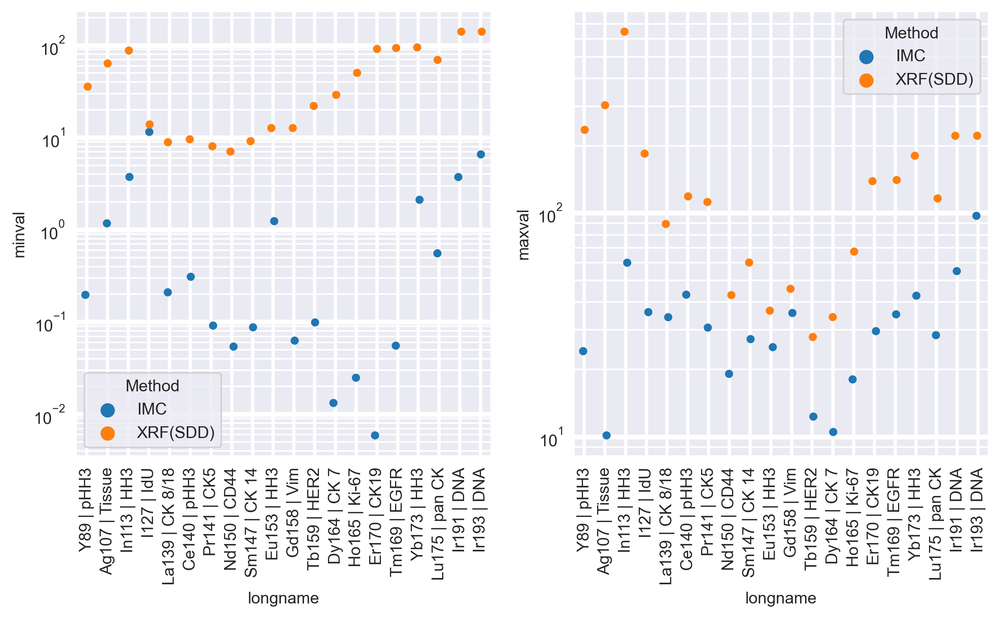

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\imc\8b_imc_cell_pellet\Fig2T_XRFIMCcomparison.svg


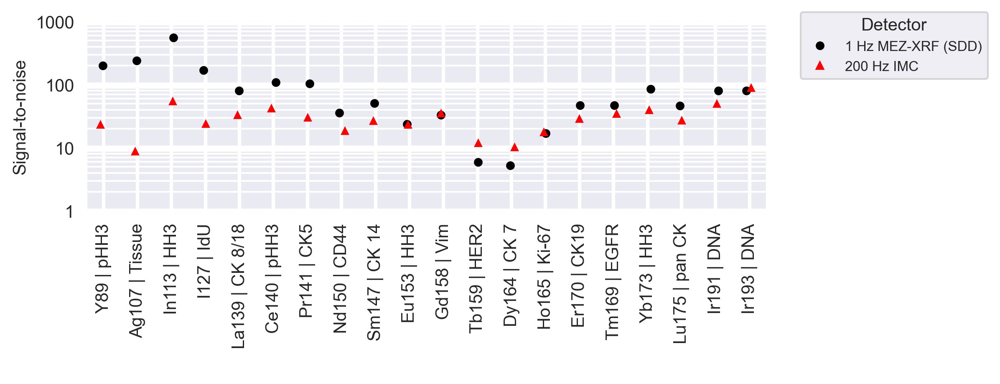

In [38]:
import matplotlib.lines as mlines
import matplotlib.pyplot as plt

# Set seaborn
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

sns.set_style("dark")

### Check max and min values
fig, axs = plt.subplots(ncols = 2, figsize=(10,5), dpi=300)

g = sns.stripplot(
    data = df_collated_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'minval',
    ax=axs[0],
    hue='Method'
)
axs[0].tick_params(axis='x', rotation=90)

# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

g = sns.stripplot(
    data = df_collated_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'maxval',
    ax=axs[1],
    hue='Method'
)
axs[1].tick_params(axis='x', rotation=90)


# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

# Sort shared legend
# axs[0].get_legend().remove()
# axs[1].get_legend().remove()
# plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)#, ha='right')
plt.show()

### Plot signal to noise
fig, ax = plt.subplots(figsize=(7,2), dpi=300)
g = sns.stripplot(
    data = df_collated_signal_to_noise[df_collated_signal_to_noise['Method'] == 'XRF(SDD)'],
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    ax=ax,
#     hue='Method',    
    color = 'black'
)

g = sns.stripplot(
    data = df_collated_signal_to_noise[df_collated_signal_to_noise['Method'] == 'IMC'],
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    ax=ax,
    hue='Method',  
    palette = ['red'],
    marker='^',
)

ax.set(yscale="log")
ax.set_ylim([1, 1000])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')
plt.xticks(rotation=90)#, ha='right')
plt.ylabel('Signal-to-noise')
plt.xlabel(' ')


# # Custom set the marker for IMC
handles, labels = ax.get_legend_handles_labels()
black_spot = mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=4, label='Black spot')
red_triangle = mlines.Line2D([], [], color='red', marker='^', linestyle='None', markersize=4, label='Red triangles')

handles[0] = black_spot
handles.append(red_triangle)


lgd = plt.legend(
    title='Detector',
    loc='upper left', bbox_to_anchor=(1.05, 1.05), 
#     ncol=2,
    borderaxespad=0., 
    labels=['1 Hz MEZ-XRF (SDD)', '200 Hz IMC'],
    handles = handles,
    fontsize=8
)

savename = out_dir / 'Fig2T_XRFIMCcomparison.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')


plt.show()